#
<FONT size="10pt"> <center>Projet 5 : Segmentez des clients d'un site e-commerce</center></FONT>. 

Vous êtes consultant pour **Olist**, une entreprise brésilienne qui propose une solution de vente sur les **marketplaces en ligne**.
Olist souhaite que vous fournissiez à ses équipes d'e-commerce une **segmentation des clients** qu’elles pourront utiliser au quotidien pour leurs campagnes de communication.

Votre objectif est de comprendre les différents types d’utilisateurs grâce à leur comportement et à leurs données personnelles.

Vous devrez **fournir à l’équipe marketing une description actionable** de votre segmentation et de sa logique sous-jacente pour une utilisation optimale, ainsi qu’une **proposition de contrat de maintenance** basée sur une analyse de la stabilité des segments au cours du temps.


<FONT size="5pt"> Les données </FONT>: 

Pour cette mission, Olist vous fournit une base de données anonymisée comportant des informations sur l’historique de commandes, les produits achetés, les commentaires de satisfaction, et la localisation des clients depuis janvier 2017.

<FONT size="5pt"> Votre mission </FONT>:

Votre mission est d’aider les équipes d’Olist à comprendre les différents types d'utilisateurs. Vous utiliserez donc des méthodes non supervisées pour regrouper des clients de profils similaires. Ces catégories pourront être utilisées par l’équipe Marketing pour mieux communiquer.

Vous créez donc un notebook et démarrez votre travail d’analyse exploratoire.

**Base de Données** : https://www.kaggle.com/olistbr/brazilian-ecommerce

# 1 : Librairies et Options 

In [1]:
import pandas as pd
import numpy as np
from PIL import Image
import missingno as msno
import matplotlib.pyplot as plt
from googletrans import Translator
import time
import tqdm
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from scipy.stats import f_oneway
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import random
import plotly.express as px

pd.options.display.max_rows = 100
pd.options.display.max_columns = 50

from IPython.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>")) # Largeur écran

pd.set_option('mode.chained_assignment', None) # Pour ne pas avoir de message d'erreur quand on crée nouvelle df à partir d'une autre (app)

# 2 : Ouverture du fichier

In [2]:
Data = pd.read_csv('DataP5.csv')

# 3 : Info générales

In [3]:
# Info :
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 81548 entries, 0 to 81547
Data columns (total 11 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   DelaisLivraison(j)     81548 non-null  int64  
 1   RetardLivraison(j)     81548 non-null  int64  
 2   DelaisDernierAchat(j)  81548 non-null  int64  
 3   NbPaiementMoyen        81548 non-null  float64
 4   CoutCommandeMoyen      81548 non-null  float64
 5   CoutTransportMoyen     81548 non-null  float64
 6   ScoreMoyen             81548 non-null  int64  
 7   NbCommandeTotal        81548 non-null  int64  
 8   DistanceOiseau         81548 non-null  int64  
 9   CoutTotal              81548 non-null  float64
 10  CoutTotal(log)         81548 non-null  float64
dtypes: float64(5), int64(6)
memory usage: 6.8 MB


In [4]:
# Toutes les variables :
Data.head()

,DelaisLivraison(j),RetardLivraison(j),DelaisDernierAchat(j),NbPaiementMoyen,CoutCommandeMoyen,CoutTransportMoyen,ScoreMoyen,NbCommandeTotal,DistanceOiseau,CoutTotal,CoutTotal(log)
0,6,0,436,8.0,129.90,12.00,5,1,109,141.90,4.962145
1,3,0,439,1.0,18.90,8.29,4,1,16,27.19,3.338967
2,26,0,862,8.0,69.00,17.22,3,1,520,86.22,4.468434
3,20,0,646,4.0,25.99,17.63,4,1,2466,43.62,3.798182
4,13,0,613,6.0,180.00,16.89,5,1,154,196.89,5.287711


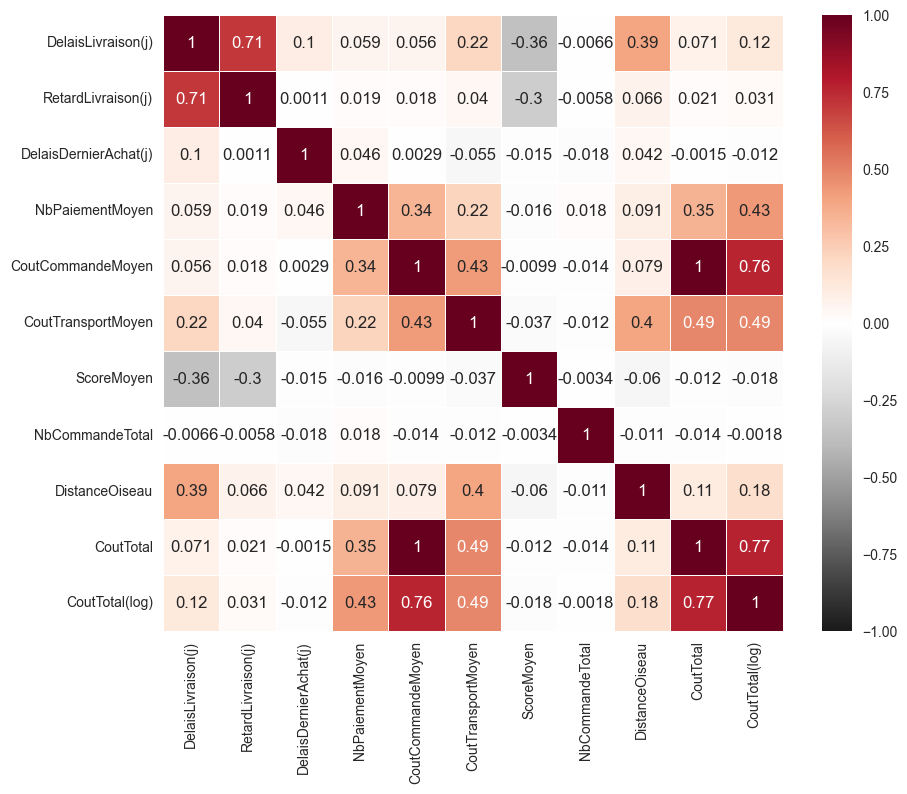

In [5]:
# Heatmap de corrélation :
plt.subplots(figsize = (10,8))
sns.heatmap(Data.corr(), vmin = -1, vmax = 1, linewidths = 0.5, annot = True, cmap = "RdGy_r");

- **On observe une corrélation entre le cout total et le cout total (log) ce qui est logique.**
- **Entre le Cout total, le cout commande moyen le nombre de paiement moyen et le cout transport moyen.**
- **Entre le score moyen, le delais et le retard de livraison.**
- **Entre le delais et le retard de livraison.**
- **Entre la distance entre les villes vendeurs et acheteur et le delais de livraison.**

# 4 : Définitions :

In [6]:
def MinMaxScaler(df):
    from sklearn.preprocessing import MinMaxScaler
    scaler = MinMaxScaler().fit(df)
    Scores = pd.DataFrame(scaler.transform(df))
    Scores.columns = df.columns
    X = Scores
    return X

In [7]:
def Standardisation(X):
    scaler2 = StandardScaler()
    scaler2.fit(X)
    X_scaled = scaler2.transform(X)
    X_scaled = pd.DataFrame(X_scaled)
    X_scaled.columns = X.columns
    return X_scaled

In [8]:
def PCA (X_scaled):
    from sklearn.decomposition import PCA
    pca = PCA(n_components = 0.8)
    X_pca = pca.fit_transform(X_scaled)
    X_pca = pd.DataFrame(X_pca)
    return X_pca, pca

In [9]:
def Eboulis(model, longueur):
    scree = (model.explained_variance_ratio_*100).round(2)
    scree_cum = scree.cumsum().round()
    x_list = range(1, longueur.shape[1] + 1)
    plt.subplots(figsize = (5,4))
    plt.bar(x_list, scree)
    plt.plot(x_list, scree_cum,c="red",marker='o')
    plt.xlabel("rang de l'axe d'inertie")
    plt.ylabel("pourcentage d'inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block=False)

In [10]:
def CercleCorrelation(model, longueur):
    
    # tableau :
    features = X.columns
    x_list = range(1, longueur.shape[1] + 1)
    pcs = model.components_
    pcs = pd.DataFrame(pcs)
    pcs.columns = features
    pcs.index = [f"F{i}" for i in x_list]


    # Cercle de corrélation :
    x, y = 0,1

    fig, ax = plt.subplots(figsize=(5, 4))
    for i in range(0, model.components_.shape[1]):
        ax.arrow(0,
                 0,  # Start the arrow at the origin
                 model.components_[0, i],  #0 for PC1
                 model.components_[1, i],  #1 for PC2
                 head_width=0.07,
                 head_length=0.07, 
                 width=0.02,              )

        plt.text(model.components_[0, i] + 0.05,
                 model.components_[1, i] + 0.05,
                 features[i])

    # affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')


    # nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*model.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*model.explained_variance_ratio_[y],1)))

    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))


    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale
    plt.axis('equal')
    plt.show(block=False)
    
    return pcs.round(2)

In [11]:
def elbow(X_scaled) : 
    from sklearn.cluster import KMeans
    model = KMeans(random_state = 42, n_init = 10)
    elb_visualizer = KElbowVisualizer(model, k=10).fit(X_scaled)    
    elb_visualizer.show()
    return elb_visualizer.elbow_value_

In [12]:
def Silouhette (X_scaled) :
    from sklearn.cluster import KMeans
    model = KMeans(n_clusters, random_state = 42, n_init = 10)
    visualizer = SilhouetteVisualizer(model).fit(X_scaled)
    visualizer.poof() 

In [13]:
def KMeans (X_scaled, n_clusters) :
    from sklearn.cluster import KMeans
    model = KMeans(n_clusters = n_clusters, n_init = 10)
    clusters = model.fit_predict(X_scaled)
    return clusters, model

In [14]:
def Centroides (model) : 
    Centroide = model.cluster_centers_
    Centroide = pd.DataFrame(Centroide)
    return Centroide

In [15]:
def StatTukey(X):
    Stat = X.copy()
    Valeurs, Groups = [], []

    for i in (Stat['KMeans'].unique()):
        for listes in (Stat[Stat['KMeans'] == i].iloc[:,:-1].values.tolist()):
            for valeur in listes:
                Valeurs.append(valeur)
                Groups.append(i)

    dict = {'Valeurs': Valeurs, 'Groups': Groups}
    df = pd.DataFrame(dict) 
    
    return pairwise_tukeyhsd(df["Valeurs"], df["Groups"])._results_table

In [16]:
def RadarShart(X):
    Y = X.copy()
    
    # GroupBy sur les KMeans :
    NBClients = Y['KMeans'].value_counts()
    GP = Y.groupby('KMeans').mean()
    Y = pd.merge(GP, NBClients, right_index = True, left_index = True)
    Y.rename(columns = {'KMeans' : 'NbClients'}, inplace = True)
    
    # Renommer les groupes :
    if len(df.columns) == 4 : 
        def NameGroupe(value) :
            DicoGroupeName = {}
            DicoGroupeName[Y.sort_values('NbCommandeTotal', ascending = False).index[0]] =  'Meilleur Acheteur en nb de commande'
            DicoGroupeName[Y.sort_values('CoutTotal(log)', ascending = False).index[0]] =  'Meilleur Acheteur en cout global'
            DicoGroupeName[Y.sort_values('ScoreMoyen', ascending = True).index[0]] =  'Acheteur le plus mécontent'
            DicoGroupeName[Y.sort_values('DelaisDernierAchat(j)', ascending = False).index[0]] =  'Acheteur le plus lointain'
            DicoGroupeName[Y.sort_values('DelaisDernierAchat(j)', ascending = True).index[0]] =  'Acheteurs les plus récents'
            return DicoGroupeName[value]

        Y = Y.reset_index()
        Y['index'] = Y['index'].apply(NameGroupe)
        Y = Y.set_index('index')
    
    else:
        pass

    # Radars : 
    Variable = list(Y.iloc[:,:-1].columns)
    Variable.append(Variable[0])

    Analyse = Y.iloc[:,:-1].T 
    Line = Analyse.iloc[:1,:]
    Analyse = pd.concat([Analyse,Line])
    Colonne = Analyse.columns

    label_placement = np.linspace(start = 0, stop = 2*np.pi, num = len(Variable))
    plt.figure(figsize = (5,4))
    plt.subplot(polar = True)
    plt.plot(label_placement, Analyse)
    plt.fill(label_placement, Analyse, alpha=0.3)

    lines, labels = plt.thetagrids(np.degrees(label_placement), labels = Variable)

    plt.tick_params(axis='both', which='major', pad=40)
    plt.legend(labels = Y.index, loc = (0.95,0.8))
    plt.show()

In [17]:
def Graphiques(X) :
    NBClients = X['KMeans'].value_counts()
    GP = X.groupby('KMeans').mean()
    Z = pd.merge(GP, NBClients, right_index = True, left_index = True)
    Z.rename(columns = {'KMeans' : 'NbClients/Groupes'}, inplace = True)
    
    # Renommer les groupes :
    if len(df.columns) == 4 : 
        def NameGroupe(value) :
            DicoGroupeName = {}
            DicoGroupeName[Z.sort_values('NbCommandeTotal', ascending = False).index[0]] =  'Meilleur Acheteur en nb de commande'
            DicoGroupeName[Z.sort_values('CoutTotal', ascending = False).index[0]] =  'Meilleur Acheteur en cout global'
            DicoGroupeName[Z.sort_values('ScoreMoyen', ascending = True).index[0]] =  'Acheteur le plus mécontent'
            DicoGroupeName[Z.sort_values('DelaisDernierAchat(j)', ascending = False).index[0]] =  'Acheteur le plus lointain'
            DicoGroupeName[Z.sort_values('DelaisDernierAchat(j)', ascending = True).index[0]] =  'Acheteurs les plus récents'

            return DicoGroupeName[value]

        Z = Z.reset_index()
        Z['index'] = Z['index'].apply(NameGroupe)
        Z = Z.set_index('index')
    
    else:
        pass

    # Visualisation graphique :
    zones = [(4,3,1),(4,3,2),(4,3,3),(4,3,4),(4,3,5),(4,3,6),(4,3,7),(4,3,8),(4,3,9),(4,3,10), (4,3,11)]
    zones = zones[:len(Z.columns)]
    colonnes = Z.columns

    fig = plt.figure(figsize=(20,20))
    for column, zone in zip(colonnes, zones) :
        plt.subplot(list(zone)[0], list(zone)[1], list(zone)[2])
        ax = sns.barplot(x = Z[column].index, y = Z[column].values )
        ax.bar_label(ax.containers[0], padding=4)
        plt.title(column)
        plt.xticks(rotation = 75)
        plt.subplots_adjust(hspace=1.2)
        plt.xlabel('')
        ax.margins(y=0.5)
    plt.show()

In [18]:
def Boxplotes(X) :

    # Visualisation graphique :
    zones = [(4,3,1),(4,3,2),(4,3,3),(4,3,4),(4,3,5),(4,3,6),(4,3,7),(4,3,8),(4,3,9),(4,3,10), (4,3,11)]
    zones = zones[:len(X.iloc[:,:-1].columns)]
    colonnes = X.iloc[:,:-1].columns

    fig = plt.figure(figsize=(20,20))
    for column, zone in zip(colonnes, zones) :
        plt.subplot(list(zone)[0], list(zone)[1], list(zone)[2])
        sns.boxplot(x = X['KMeans'], y = X[column] )
        plt.title(column)
        plt.subplots_adjust(hspace=0.3)
    plt.show()

In [19]:
def Pairplot(X) : 
    sns.pairplot(X, hue = 'KMeans', palette = 'Dark2')
    plt.show()

# 5 : Analyse sur variables pertinantes RFM (Recence achat, Fréquence, Montant)

In [20]:
# Création des variables :
df = Data[['DelaisDernierAchat(j)', 'NbCommandeTotal', 'CoutTotal(log)']]
DF = Data.iloc[:,:-1].copy()

Taille de la DF au départ : (81548, 3)
Taille de la DF aprés PCA : (81548, 3)
Explication de la variance : [0.34029163 0.33389477 0.3258136 ]


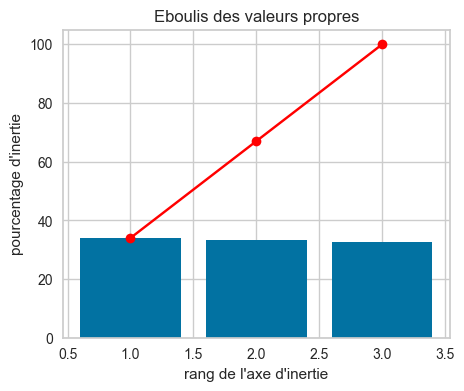

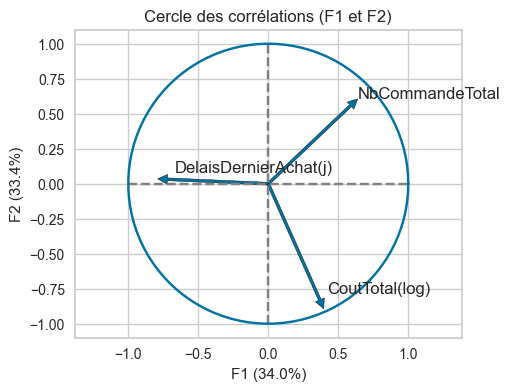

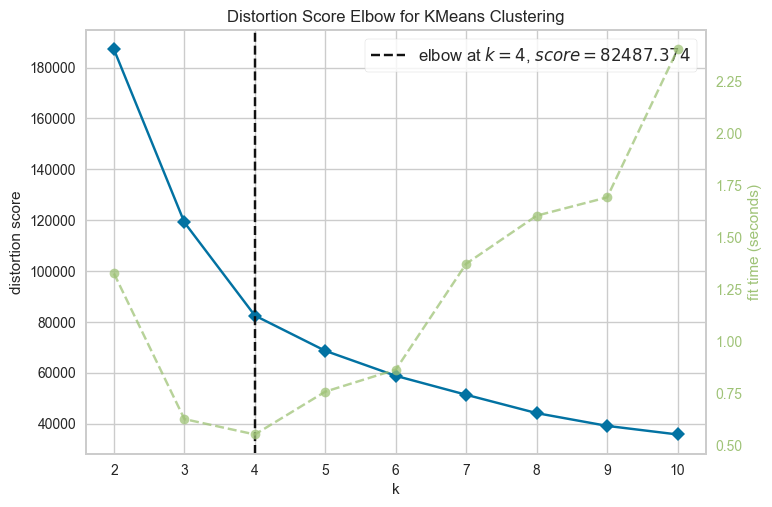

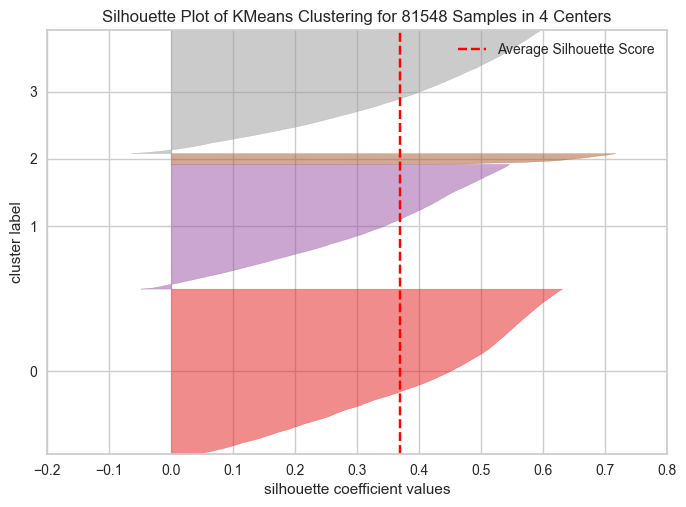

Résultats du test statistique de Tuckey :
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
     0      1   0.0899   0.0  0.0829  0.0969   True
     0      2   0.1533   0.0  0.1507   0.156   True
     0      3    0.082   0.0  0.0794  0.0847   True
     1      2   0.0634   0.0  0.0564  0.0705   True
     1      3  -0.0079 0.022  -0.015 -0.0008   True
     2      3  -0.0713   0.0 -0.0742 -0.0685   True
---------------------------------------------------
Graphique Radar de comparaison des groupes :


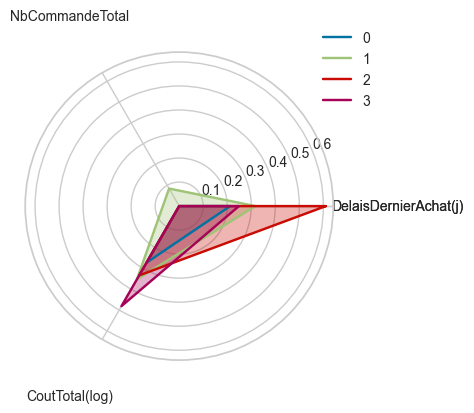

Résultats des variables par groupes :


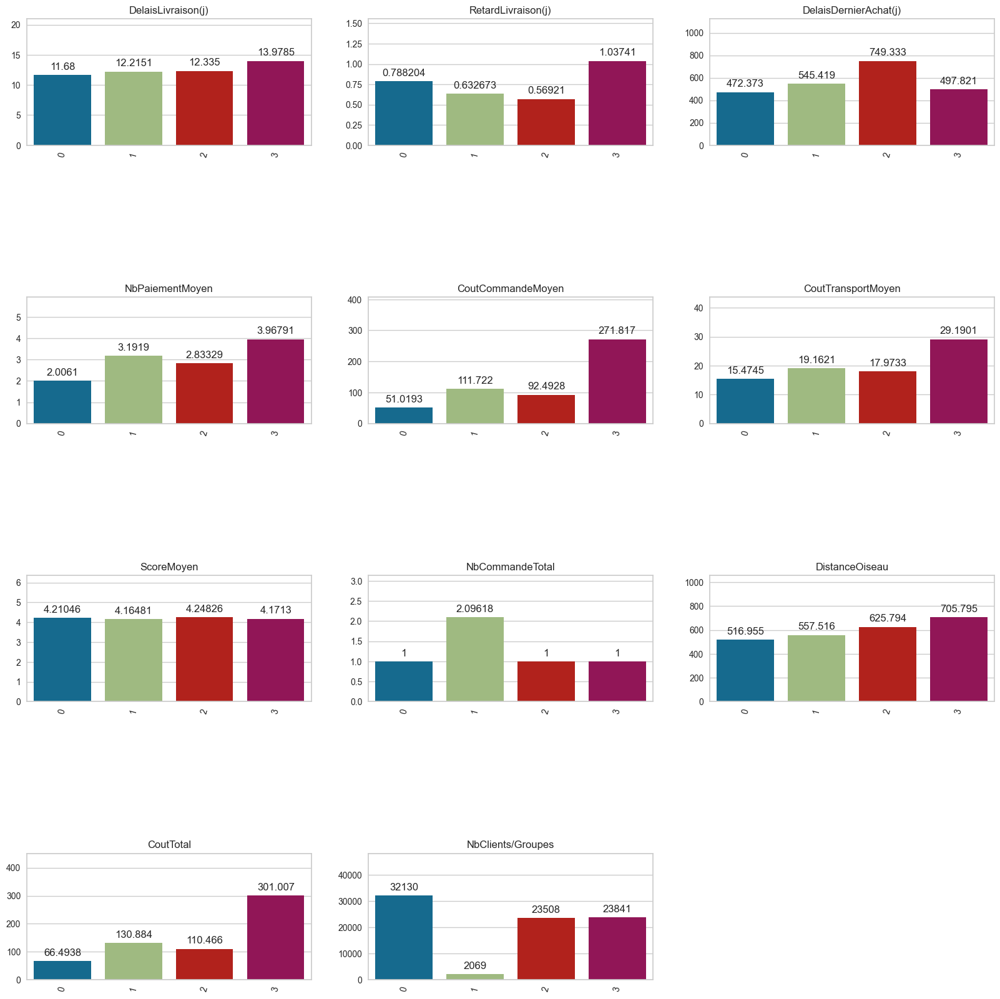

None


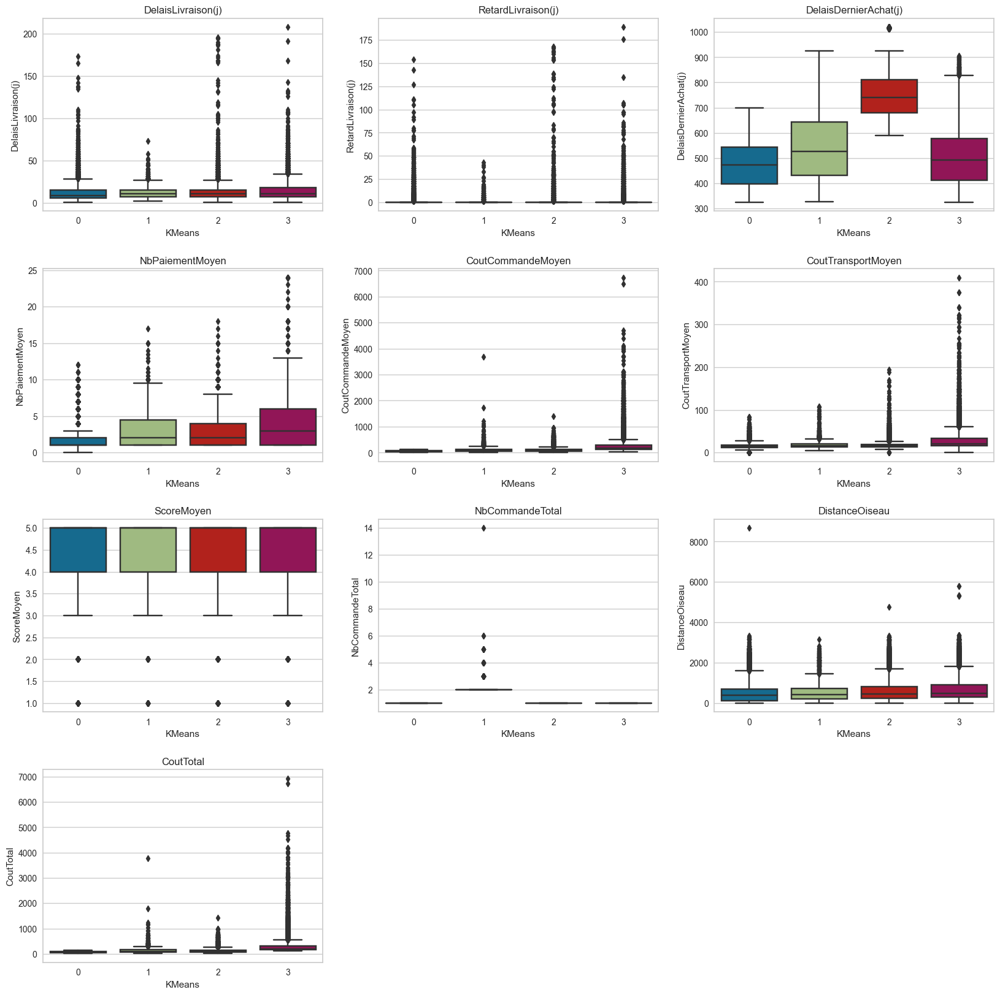

None
Visualisation en Pairplot des différents groupes :


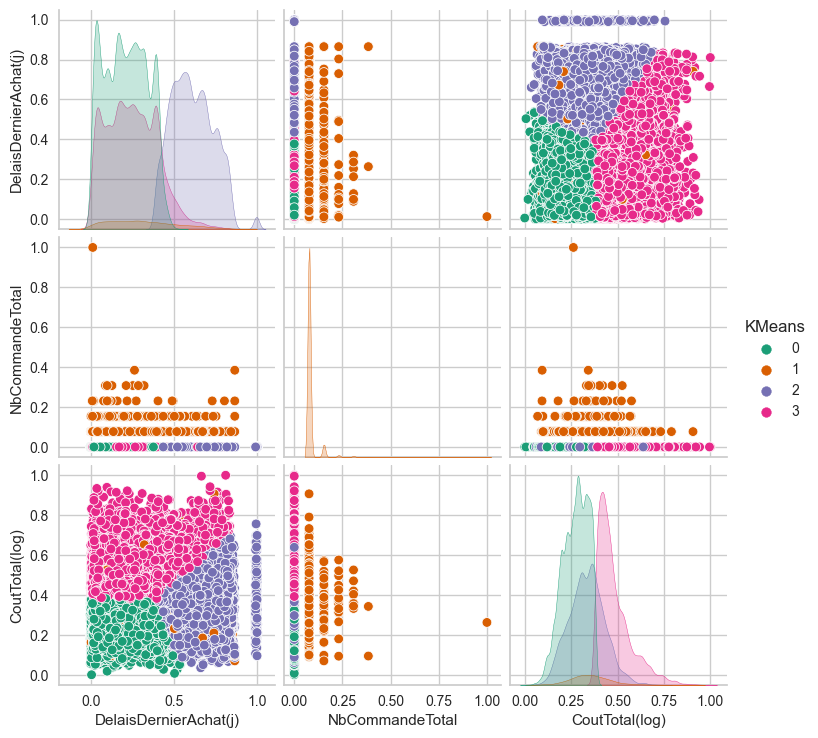

In [21]:
# Résultats :
# MinMaxScaler:
X = MinMaxScaler(df)

# Standardisation des données et PCA :
X_scaled = Standardisation(X)
print('Taille de la DF au départ :', X_scaled.shape)
X_pca = PCA(X_scaled)
print('Taille de la DF aprés PCA :', X_pca[0].shape)
print('Explication de la variance :', X_pca[1].explained_variance_ratio_)

# Eboulis et cercle de corrélation :
Eboulis(X_pca[1], X_pca[0])
CercleCorrelation(X_pca[1], X_pca[0])

# KMeans, nb clusters (elbow/silouhette) :
n_clusters = elbow(X_pca[0])
Silouhette(X_pca[0])
Values = KMeans(X_pca[0], n_clusters)
DF['KMeans'] = Values[0]
X['KMeans'] = Values[0]
Centroides(Values[1])

# Etude et analyse des résultats obtenus :
print('Résultats du test statistique de Tuckey :')
print(StatTukey(X))
print('Graphique Radar de comparaison des groupes :')
RadarShart(X)
print('Résultats des variables par groupes :')
print(Graphiques(DF))
print(Boxplotes(DF))
print('Visualisation en Pairplot des différents groupes :')
Pairplot(X)

In [22]:
# Figure 3D : 
fig = px.scatter_3d(X, x='DelaisDernierAchat(j)', y='NbCommandeTotal', z='CoutTotal(log)',
              color='KMeans')
fig.show()

In [23]:
# Pairplot sur toutes les colonnes avec ces résultats (afin de voir si les groupes peuvent impacter d'autres variables):
#DataRFM = Data.copy()
#KM = X['KMeans']
#DataRFM = pd.merge(DataRFM, KM, right_index = True, left_index = True)
#Pairplot(DataRFM)

# 6 : Ajout de nouvelles colonnes

In [24]:
Data.head()

,DelaisLivraison(j),RetardLivraison(j),DelaisDernierAchat(j),NbPaiementMoyen,CoutCommandeMoyen,CoutTransportMoyen,ScoreMoyen,NbCommandeTotal,DistanceOiseau,CoutTotal,CoutTotal(log)
0,6,0,436,8.0,129.90,12.00,5,1,109,141.90,4.962145
1,3,0,439,1.0,18.90,8.29,4,1,16,27.19,3.338967
2,26,0,862,8.0,69.00,17.22,3,1,520,86.22,4.468434
3,20,0,646,4.0,25.99,17.63,4,1,2466,43.62,3.798182
4,13,0,613,6.0,180.00,16.89,5,1,154,196.89,5.287711


In [25]:
# Création des variables :
df = Data[['DelaisDernierAchat(j)', 'NbCommandeTotal', 'CoutTotal(log)','ScoreMoyen']]
DF = Data.iloc[:,:-1].copy()

Taille de la DF au départ : (81548, 4)
Taille de la DF aprés PCA : (81548, 4)
Explication de la variance : [0.25540886 0.25443891 0.24890773 0.2412445 ]


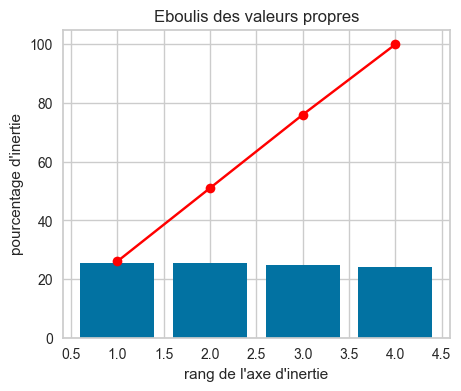

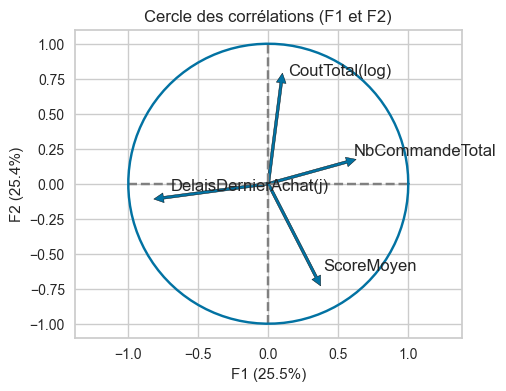

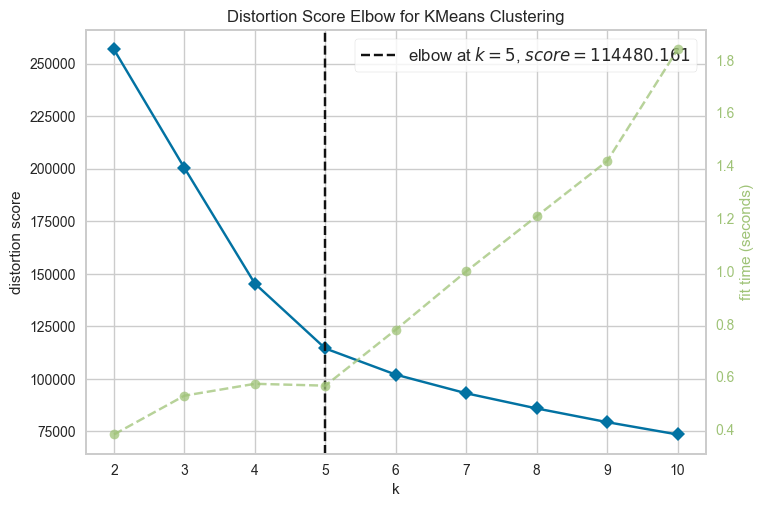

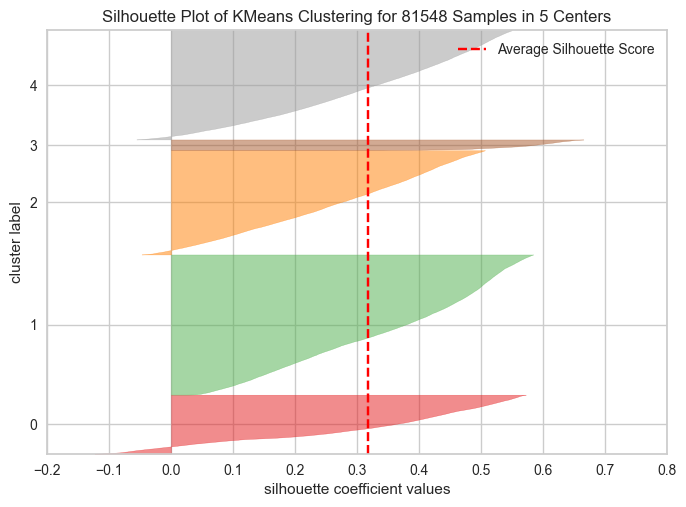

Résultats du test statistique de Tuckey :
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
     0      1   0.1149   0.0  0.1107  0.1191   True
     0      2  -0.1336   0.0 -0.1388 -0.1285   True
     0      3     0.04   0.0  0.0295  0.0505   True
     0      4   0.0637   0.0  0.0594   0.068   True
     1      2  -0.2485   0.0 -0.2539 -0.2432   True
     1      3  -0.0749   0.0 -0.0855 -0.0643   True
     1      4  -0.0512   0.0 -0.0557 -0.0467   True
     2      3   0.1736   0.0  0.1626  0.1847   True
     2      4   0.1973   0.0  0.1919  0.2027   True
     3      4   0.0237   0.0  0.0131  0.0343   True
---------------------------------------------------
Graphique Radar de comparaison des groupes :


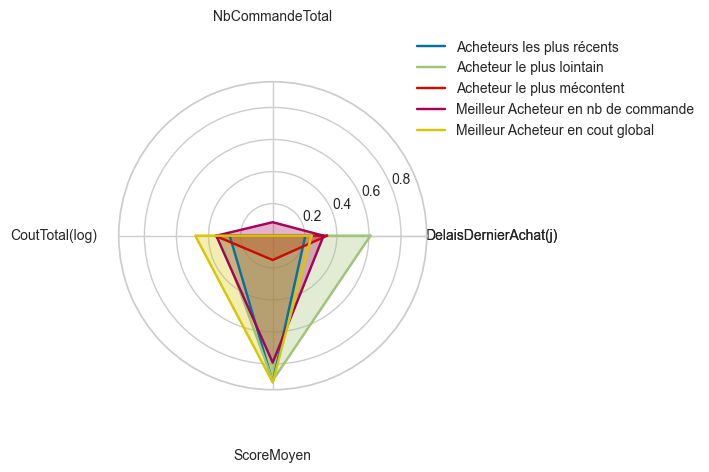

Résultats des variables par groupes :


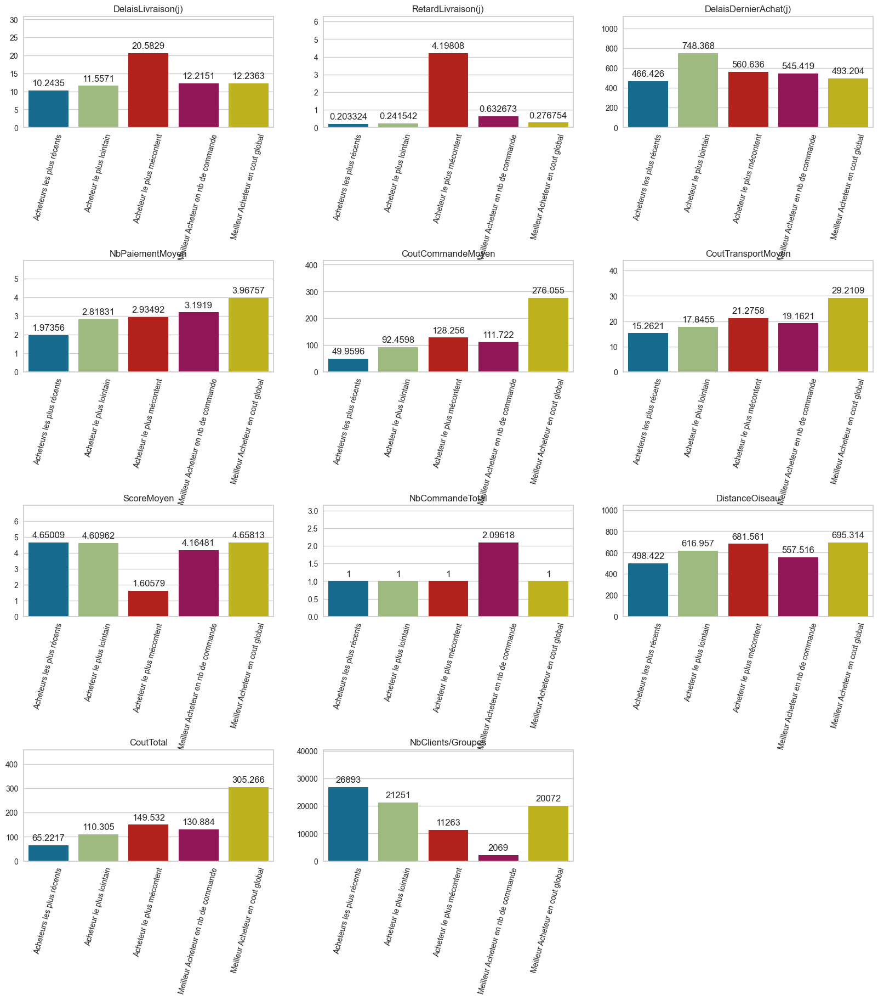

None


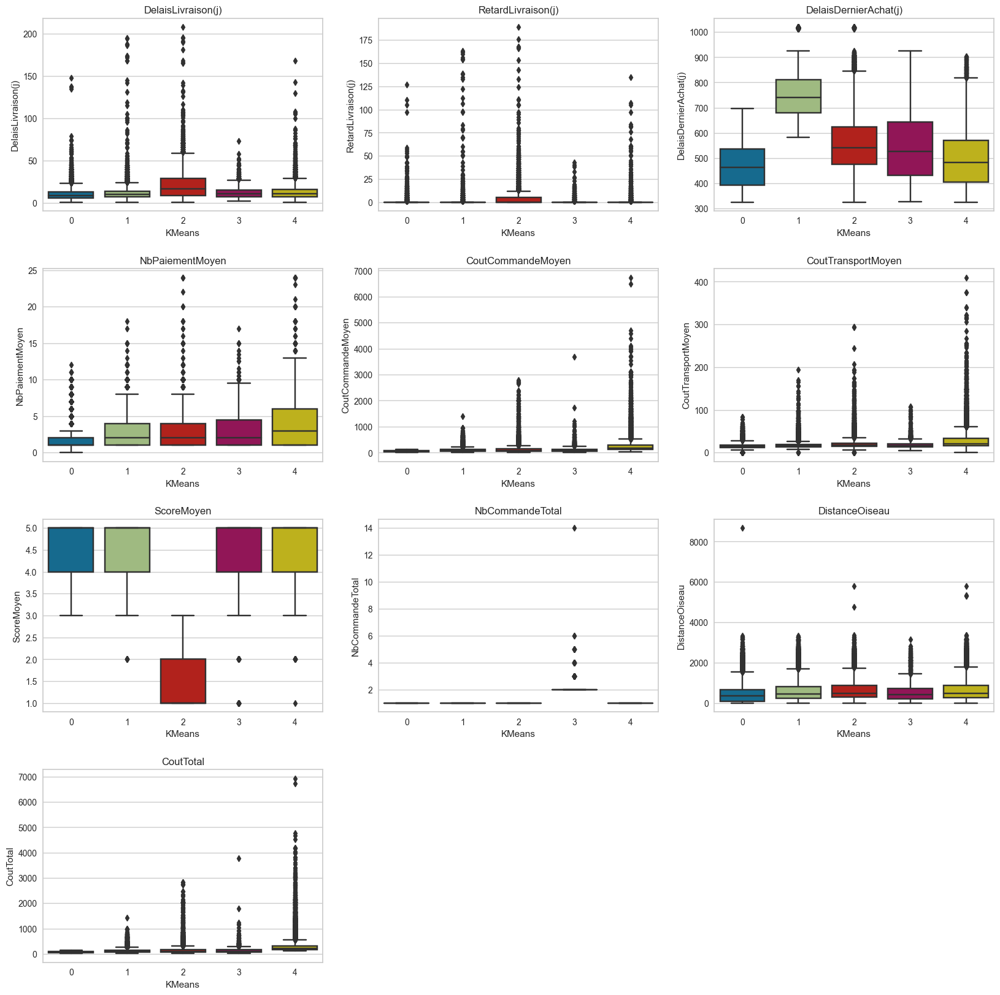

None
Visualisation en Pairplot des différents groupes :


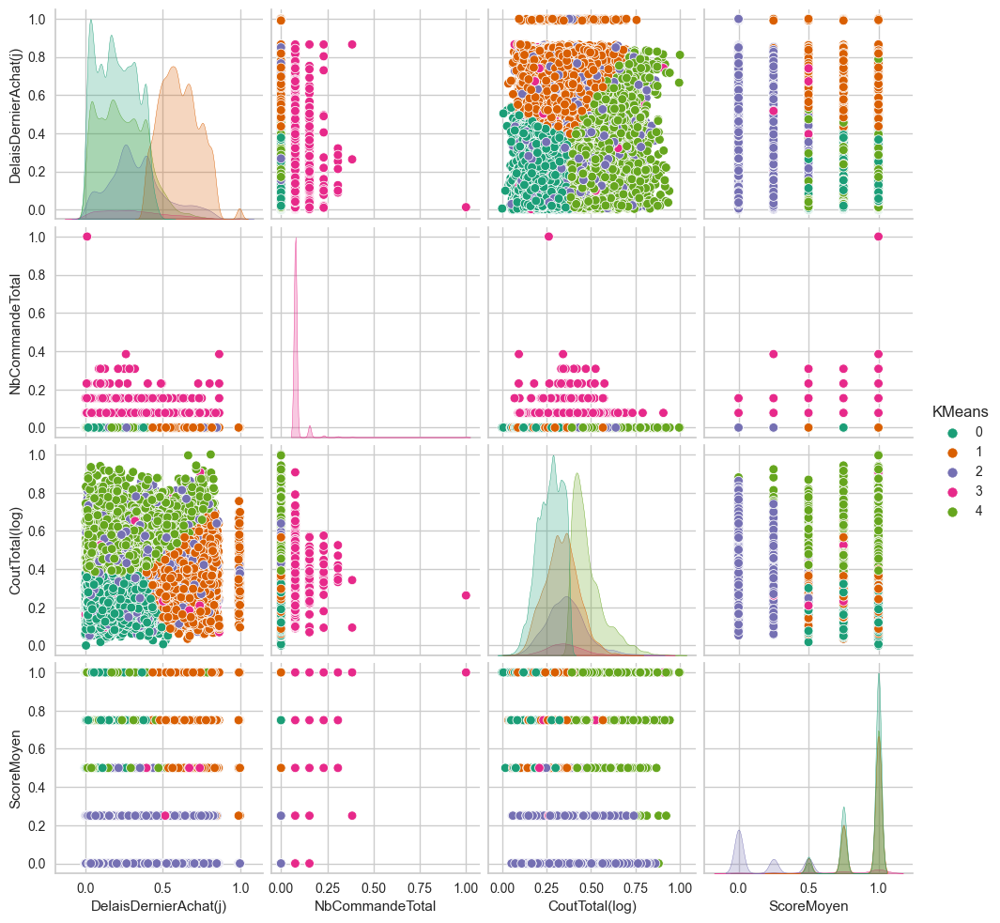

In [26]:
# Résultats :
# MinMaxScaler:
X = MinMaxScaler(df)

# Standardisation des données et PCA :
X_scaled = Standardisation(X)
print('Taille de la DF au départ :', X_scaled.shape)
X_pca = PCA(X_scaled)
print('Taille de la DF aprés PCA :', X_pca[0].shape)
print('Explication de la variance :', X_pca[1].explained_variance_ratio_)

# Eboulis et cercle de corrélation :
Eboulis(X_pca[1], X_pca[0])
CercleCorrelation(X_pca[1], X_pca[0])

# KMeans, nb clusters (elbow/silouhette) :
n_clusters = elbow(X_pca[0])
Silouhette(X_pca[0])
Values = KMeans(X_pca[0], n_clusters)
DF['KMeans'] = Values[0]
X['KMeans'] = Values[0]
Centroides(Values[1])

# Etude et analyse des résultats obtenus :
print('Résultats du test statistique de Tuckey :')
print(StatTukey(X))
print('Graphique Radar de comparaison des groupes :')
RadarShart(X)
print('Résultats des variables par groupes :')
print(Graphiques(DF))
print(Boxplotes(DF))
print('Visualisation en Pairplot des différents groupes :')
Pairplot(X)

- **RFM donne 3 groupes 1 de client qui a le plus gros delais depuis son achat, un avec les clients ayant fait plus de 1 commande et un avec un cout total le plus elevé.**
- **L'ajout de la colonne score et delais de livraison ajoute un groupe de client mécontent avec un bon rapport entre les deux.**

# 7 : Autres algo de clustering

In [27]:
# Matrice aléatoire :
MF = Data[['DelaisDernierAchat(j)', 'NbCommandeTotal', 'CoutTotal(log)','ScoreMoyen']].sample(30000, random_state = 42)

In [28]:
from sklearn.cluster import AgglomerativeClustering
clustering = AgglomerativeClustering().fit(MF)
z = clustering.labels_
pd.DataFrame(z)[0].unique()

array([1, 0], dtype=int64)

In [29]:
from sklearn.cluster import DBSCAN
import numpy as np
clustering = DBSCAN(eps=3, min_samples=100).fit(MF)
aa = clustering.labels_
pd.DataFrame(aa)[0].unique()

array([ 0, -1,  2,  1,  3], dtype=int64)